## Laboratorium 8.1


## Metody wykrywania ruchu: przepływ optyczny (_optical flow_)

### Wstęp

Na poprzednich laboratoriach poznaliśmy podstawowe metody przetwarzania obrazów, a więc dwuwymiarowych sygnałów przestrzennych. Wiele z tych metod działa także dla (trójwymiarowego) sygnału wideo, jeśli - nieco naiwnie - potraktujemy go jako po prostu sekwencję niezależnych obrazów.

W tej liście wykorzystasz także dziedziną czasową do przetwarzania sygnału. Podstawowa intuicja polega na tym, że jeśli jakiś rejon obrazu przesunął się w czasie, to prawdopodobnie ma on inne _znaczenie_ niż rejon, który pozostał w tym samym miejscu, lub przesunął w innym kierunku czy z inną szybkością. Jeśli zatem jesteśmy w stanie wykryć to przesunięcie - czyli po prostu _ruch_ - to otrzymamy pewną informację o zawartości obrazu (wideo). Na przykład, będziemy w stanie oddzielić poruszające się obiekty od stacjonarnego tła, albo oddzielić inaczej poruszające się obiekty.

Jedną z najpowszechniejszych metodą do automatycznej detekcji ruchu jest znana Ci już z wykładu metoda przepływu optycznego (ang. _optical flow_). Namawiam też do lektury [artykułu z dokumentacji OpenCV](https://docs.opencv.org/3.4/d4/dee/tutorial_optical_flow.html), zwłaszcza sekcji _Lucas-Kanade_ oraz _Dense Optical Flow_. Analizując kod metody, poświęć chwilę na zrozumienie mapowania wyników do prezentowanego obrazu w przestrzeni HSV.

Wiedzieć należy na pewno, że istnieją dwie główne odmiany metody przepływu optycznego:,
* przepływ gęsty (_dense_) - gdzie przesunięcie pomiędzy klatkami określane jest dla każdego piksela (na tej metodzie skupia się niniejsza część listy),
* przepływ rzadki (_sparse_) - gdzie ruch wykrywany jest tylko dla pewnego zbioru punktów zainteresowania w obrębie obrazu (przebadasz ją w drugiej części listy).

W ramach obu odmian występuje pewna liczba konkretnych metod obliczeniowych, w zależności od konkretnego podejścia do rozwiązywania równania ruchu. Na tych zajęciach wykorzystamy [algorytm Farnebacka](http://www.diva-portal.org/smash/get/diva2:273847/FULLTEXT01.pdf) - głównie dlatego, że jego gotowa implementacja znajduje się w pakiecie OpenCV.

### Podejście

Większość algorytmów optical flow operuje na parze klatek, znajdując wektory translacji pomiędzy rejonami z jednej i drugiej. Jeśli więc interesuje nas przetwarzanie ciągłego strumienia wideo, praca przebiegać będzie na zasadzie dwuelementowej kolejki, tzn. zawsze patrzymy na klatkę obecną $I(x,y,t)$ i poprzednią $I(x,y,t-1)$.

OpenCV oferuje banalnie prosty a zarazem potężny interfejs do obsługi strumieni wideo: [`cv2.VideoCapture`](https://docs.opencv.org/3.4/d8/dfe/classcv_1_1VideoCapture.html), za pomocą którego w ten sam sposób możemy obsługiwać pliki wideo w różnym kodowaniu, urządzenia wideo (np. kamerkę w laptopie) czy nawet wideo w protokole IP (choć występują pewne różnice z punktu widzenia użycia, jeśli korzystamy z zasobu sprzętowego działającego w czasie rzeczywistym). Idea jest prosta:
* tworzymy obiekt `cv2.VideoCapture` w odpowiedni sposób,
* pobieramy poszczególne klatki za pomocą metody [`VideoCapture::read`](https://docs.opencv.org/3.4/d8/dfe/classcv_1_1VideoCapture.html#a473055e77dd7faa4d26d686226b292c1).

Metoda `read` wykonuje całą pracę (odczytanie danych, dekodowanie strumienia wideo) i zwraca klatkę jako obraz w standardowym formacie OpenCV (a także flagę, czy w ogóle udało się pozyskać dane - krotka (flaga, klatka)). Zatem, aby pozyskać pierwszą klatkę z pliku wideo wystarczy:
```python
vid = cv2.VideoCapture("back.mp4")
r, frame = vid.read()
```

Drobnym ograniczeniem VideoCapture jest to, że nie ma możliwości cofnięcia się do poprzednio pobranej klatki (co jest naturalne w przypadku korzystania z fizycznego urządzenia do akwizycji, a może trochę mniej gdy czytamy z pliku). Jeśli potrzebny jest powrót do początku pliku wideo, niestety konieczne jest zamknięcie strumienia (`VideoCapture::release`) i ponowne otwarcie (`::open`).

Aby obliczyć (gęsty) przepływ optyczny pomiędzy dwiema klatkami, wykorzystamy algorytm Farnebacka, zaimplementowany w OpenCV w funkcji [`cv2.calcOpticalFlowFarneback`](https://docs.opencv.org/3.4/dc/d6b/group__video__track.html#ga5d10ebbd59fe09c5f650289ec0ece5af). Przyjmuje ona parę obrazów **w skali szarości**, opcjonalny argument `flow` (rozwiązanie można zainicjować poprzednio wyliczonym przepływem, jeśli nim dysponujemy), a następnie szereg parametrów sterujących metodą; m.in. można wykorzystać piramidyzację obrazów (rekomendowane `pyr_size` $=3$) czy określić rozmiar okna detekcji `winsize`. Sensowne pierwsze wartości dla argumentów podane są w dokumentacji.

Algorytm Farnebacka zwraca przepływ w formie obrazu o wymiarach przestrzennych równych obrazom wejściowym i dwóch kanałach, zawierających przesunięcie odpowiednio w osi $x$ i $y$. Można więc przetwarzać te dane dalej, np. obliczając kąt przesunięcia czy całkowitą odległość (i dalej, np. określić prędkość ruchu) - vide np. `cv2.cartToPolar`.

---

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### Zadanie 1

#### Zadanie 1a
Otwórz wideo `kick.mp4` lub `back.mp4` i pobierz kilka klatek. Przewiń do interesującego Cię momentu - tak, aby uzyskać dwie klatki, na których widać ruch (pro-tip: znając framerate materiału (~25fps) i czas, w którym rozpoczyna się interesujący fragment, możesz w pętli "skonsumować" odpowiednią ilość klatek).  
Wykorzystaj algorytm Farnebacka do obliczenia przepływu pomiędzy klatkami. Wynik zaprezentuj w postaci obrazu całkowitego przesunięcia. W zależności od wybranego momentu w wideo, możesz spodziewać się uzyskania wyraźnych obszarów.

In [2]:
from PIL import Image
from matplotlib import pyplot as plt


def display_frame(frame):
    # Convert the frame to RGB (OpenCV uses BGR by default)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # Convert the frame to a PIL image
    img = Image.fromarray(frame_rgb)
    # Display the image using matplotlib
    plt.imshow(img)
    plt.axis("off")  # Hide the axis
    plt.show()

In [3]:
import os

kick_path = "kick.mp4"
back_path = "back.mp4"
data_dir_path = "dane"

joined_kick_path = os.path.join(data_dir_path, kick_path)
joined_back_path = os.path.join(data_dir_path, back_path)

kick_vid = cv2.VideoCapture(joined_kick_path)
back_vid = cv2.VideoCapture(joined_back_path)

In [4]:
r, frame = kick_vid.read()
r, frame.shape

(True, (480, 854, 3))

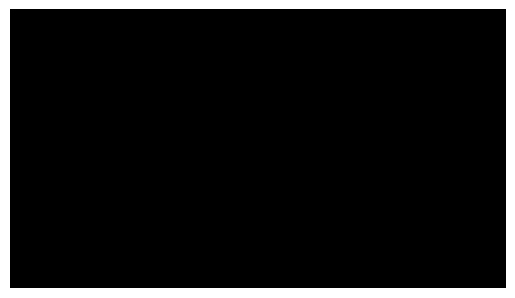

In [5]:
display_frame(frame)

In [6]:
def calc_and_display_optical_flow(
    frame_old, frame, pyr_scale, levels, winsize, iterations, poly_n, poly_sigma, flags
):
    hsv = np.zeros_like(frame_old)
    hsv[..., 1] = 255
    frame_old_gray = cv2.cvtColor(frame_old, cv2.COLOR_BGR2GRAY)
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    flow = cv2.calcOpticalFlowFarneback(
        frame_old_gray,
        frame_gray,
        None,
        pyr_scale,
        levels,
        winsize,
        iterations,
        poly_n,
        poly_sigma,
        flags,
    )
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return bgr


def display_optical_flow_results(frame_old, frame, bgr):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(frame_old, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Frame 1")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Frame 2")
    axes[1].axis("off")

    axes[2].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Optical Flow")
    axes[2].axis("off")

    plt.show()

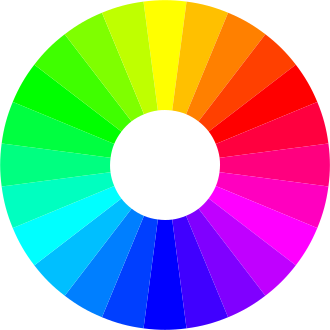

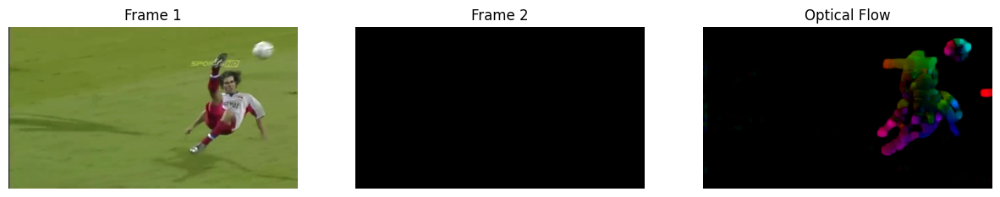

In [7]:
kick_vid = cv2.VideoCapture(joined_kick_path)
fps = kick_vid.get(cv2.CAP_PROP_FPS)
seconds_to_skip = 1.4

kick_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, kick_frame_old = kick_vid.read()

_, kick_frame = kick_vid.read()

bgr = calc_and_display_optical_flow(kick_frame_old, frame, 0.5, 3, 15, 3, 5, 1.2, 0)

display_optical_flow_results(kick_frame_old, frame, bgr)

fps: 25.36231884057971


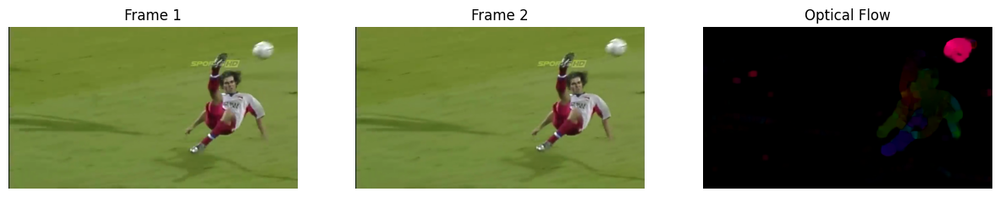

In [ ]:
kick_vid = cv2.VideoCapture(joined_kick_path)
fps = kick_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
seconds_to_skip = 1.4

kick_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, kick_frame_old = kick_vid.read()

_, kick_frame = kick_vid.read()

kick_optical_flow = calc_and_display_optical_flow(
    frame_old=kick_frame_old,
    frame=kick_frame,
    pyr_scale=0.5,
    levels=3,
    winsize=15,
    iterations=3,
    poly_n=5,
    poly_sigma=1.2,
    flags=0,
)

display_optical_flow_results(kick_frame_old, kick_frame, kick_optical_flow)

## Back

fps: 25.390625


[h264 @ 0x12fff2120] mmco: unref short failure
[h264 @ 0x12fff2120] mmco: unref short failure
[h264 @ 0x12fff2120] mmco: unref short failure
[h264 @ 0x12fff2120] mmco: unref short failure


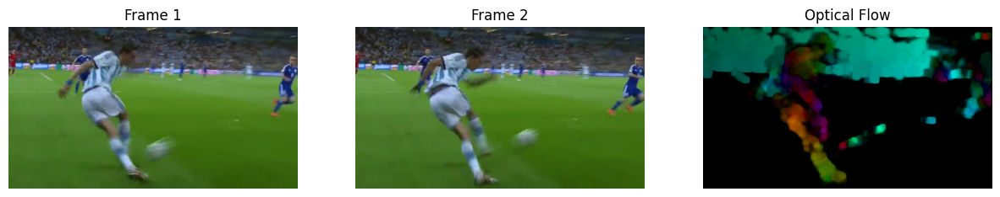

In [19]:
back_vid = cv2.VideoCapture(joined_back_path)
fps = back_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
seconds_to_skip = 1.2

back_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, back_frame_old = back_vid.read()

_, back_frame = back_vid.read()

back_optical_flow = calc_and_display_optical_flow(
    frame_old=back_frame_old,
    frame=back_frame,
    pyr_scale=0.5,
    levels=3,
    winsize=15,
    iterations=3,
    poly_n=5,
    poly_sigma=1.2,
    flags=0,
)

display_optical_flow_results(back_frame_old, back_frame, back_optical_flow)

#### Zadanie 1b
Zbadaj wpływ parametru `winsize` na działanie metody.

##### Kick

WinSize: 1


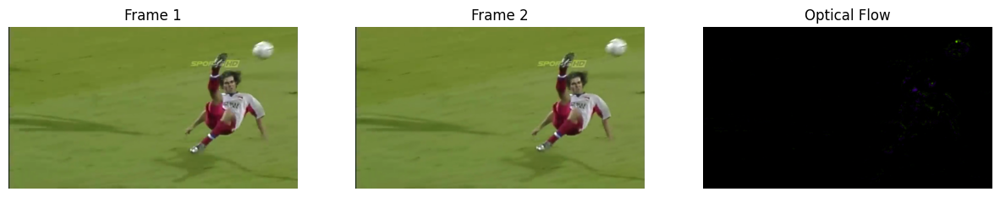

WinSize: 3


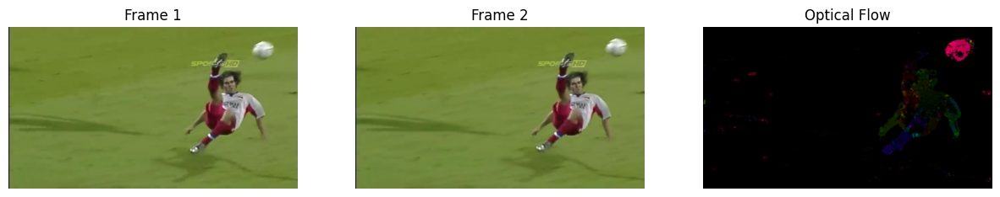

WinSize: 5


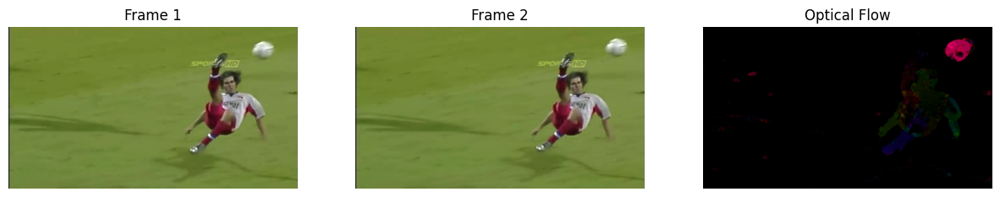

WinSize: 7


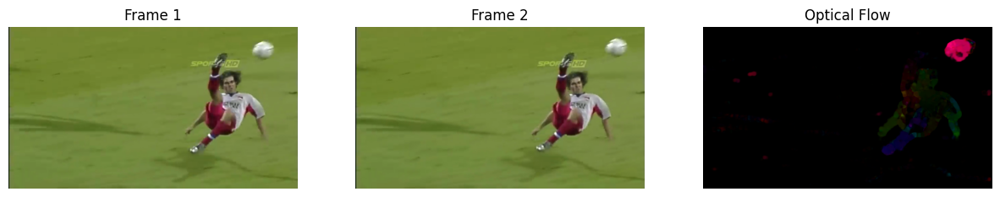

WinSize: 9


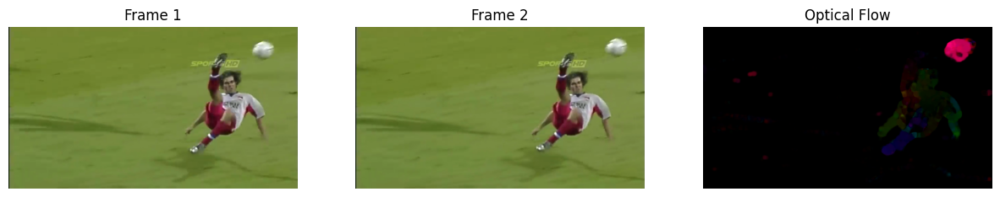

WinSize: 11


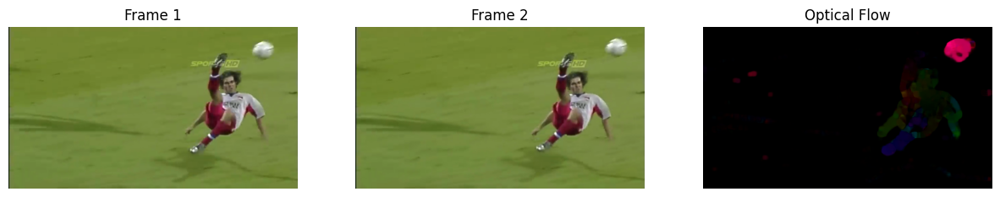

WinSize: 13


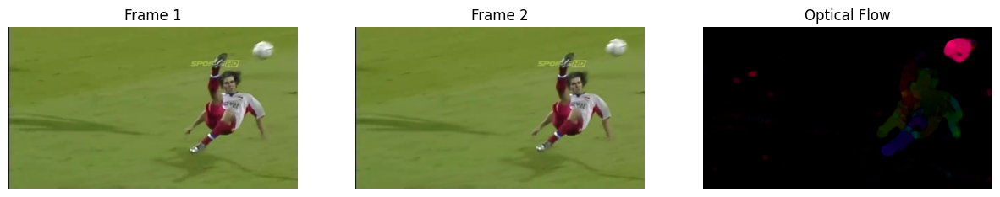

WinSize: 15


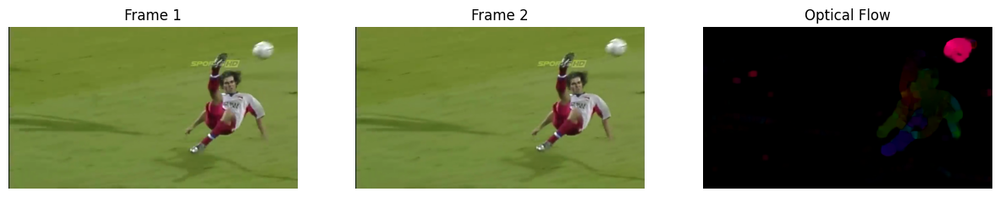

WinSize: 17


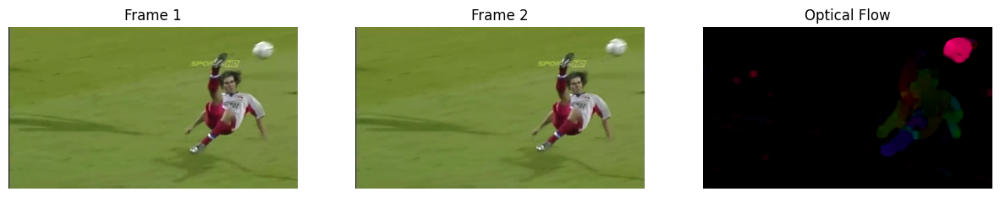

WinSize: 19


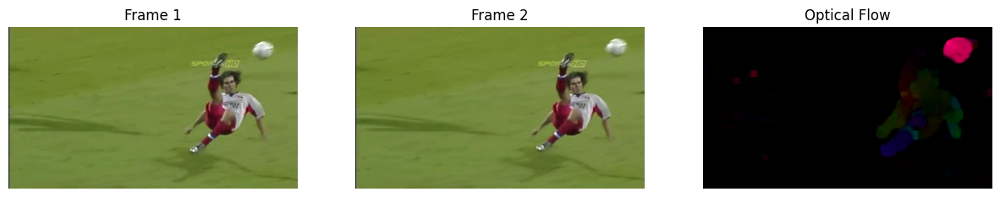

In [14]:
kick_vid = cv2.VideoCapture(joined_kick_path)
fps = kick_vid.get(cv2.CAP_PROP_FPS)
seconds_to_skip = 1.4

kick_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, kick_frame_old = kick_vid.read()

_, kick_frame = kick_vid.read()

for i in range(1, 21, 2):
    kick_optical_flow = calc_and_display_optical_flow(
        kick_frame_old, kick_frame, 0.5, 3, i, 3, 5, 1.2, 0
    )
    print(f"WinSize: {i}")
    display_optical_flow_results(kick_frame_old, kick_frame, kick_optical_flow)

##### Back

[h264 @ 0x169326ec0] mmco: unref short failure
[h264 @ 0x169326ec0] mmco: unref short failure
[h264 @ 0x169326ec0] mmco: unref short failure
[h264 @ 0x169326ec0] mmco: unref short failure


WinSize: 1


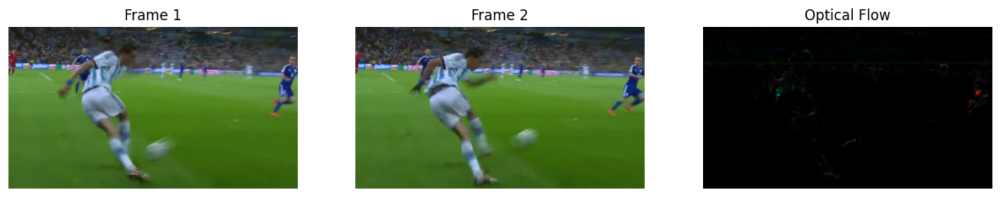

WinSize: 3


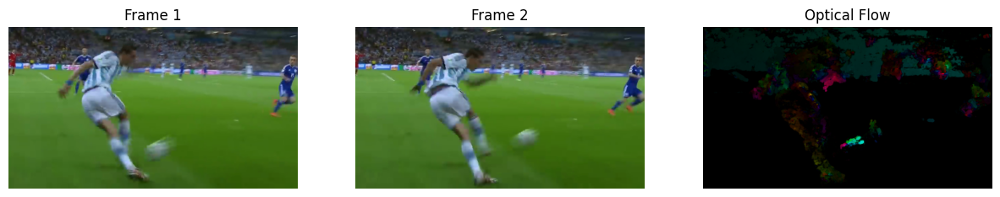

WinSize: 5


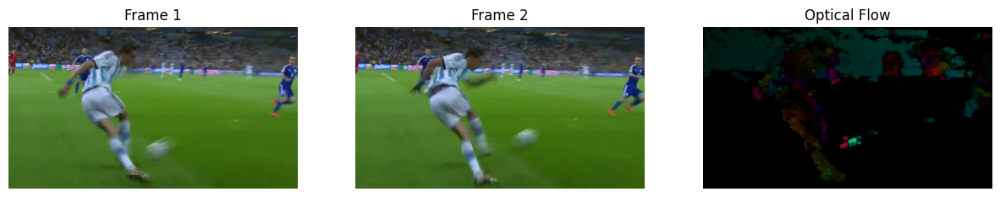

WinSize: 7


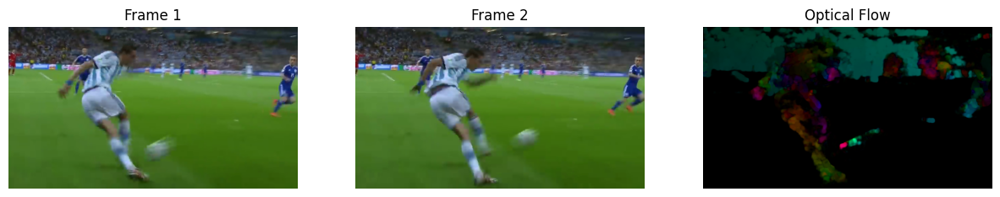

WinSize: 9


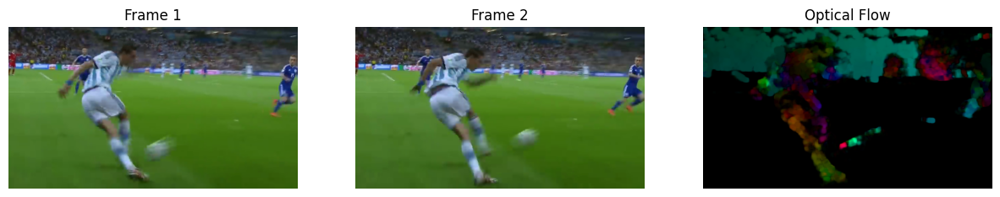

WinSize: 11


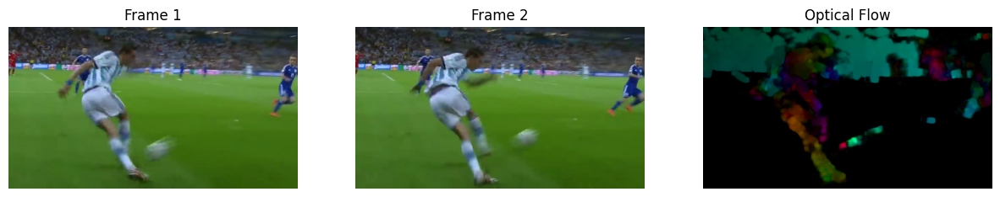

WinSize: 13


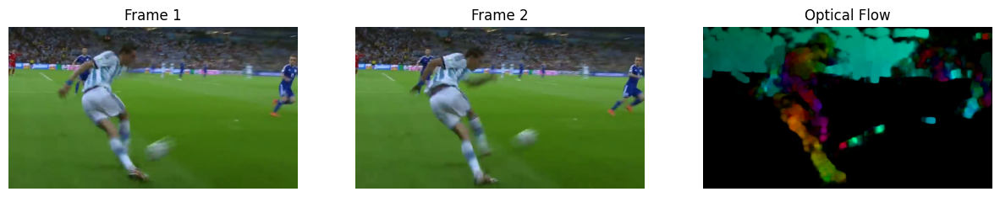

WinSize: 15


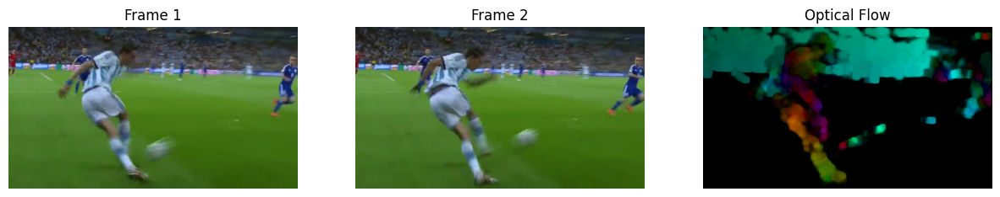

WinSize: 17


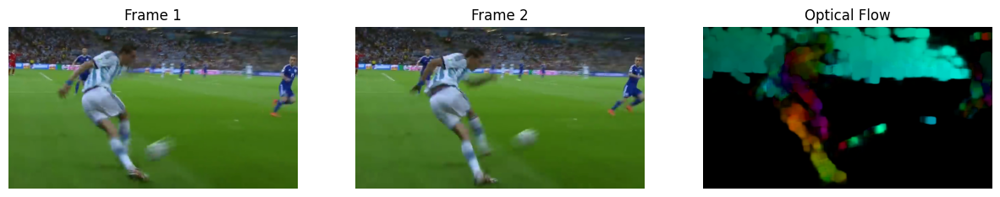

WinSize: 19


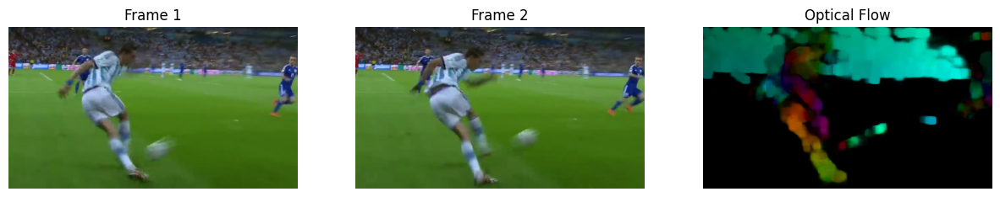

In [20]:
back_vid = cv2.VideoCapture(joined_back_path)
fps = back_vid.get(cv2.CAP_PROP_FPS)
seconds_to_skip = 1.2

back_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, back_frame_old = back_vid.read()

_, back_frame = back_vid.read()

for i in range(1, 21, 2):
    back_optical_flow = calc_and_display_optical_flow(
        back_frame_old, back_frame, 0.5, 3, i, 3, 5, 1.2, 0
    )
    print(f"WinSize: {i}")
    display_optical_flow_results(back_frame_old, back_frame, back_optical_flow)

Komentarz 1:
1. Po pierwsze są inne wyniki z powodu różnych okoliczności nagrania. `kick.mp4` to nagranie z kamery slow-motion, ruch jest bardziej płynny, tło również jest płynne, powolniejszy ruch. Kopnięcie oraz ruch piłki jest bardziej dynamiczny or reszty. `back.mp4` to nagranie z kamery zwykłej, widać niestabilny ruch kamery, nagranie real-time. Mamy do czynienia z zoom-outem, lekkim panningiem, tak aby złapać kierunek ruchu piłki kopniętej przez Rodrigo De Paul'a.
2. Analizując kolory - kieurnek w hue, można zauważyć, że w `kick.mp4` mamy do czynienia z jednym kierunkiem ruchu, natomiast w `back.mp4` mamy do czynienia z dwoma kierunkami ruchu. W `kick.mp4` mamy do czynienia z ruchem piłki, natomiast w `back.mp4` mamy do czynienia z ruchem piłki oraz ruchem tła. Co najlepsze, przez dynamiczną akcję, ruch kamery, piłka według kierunków porusza się nie w kierunku odpowiadającym ruchowi piłki jakbyśmy się spodziewali tylko w przeciwnym. Dlatego wykonano kolejne badanie poniżej, na którym niema takowego efektu. Dlaczego?
3. Wraz ze zwiększaniem `winsize` w algorytmie gęstego przeływu optycznego Farneback'a zwiększamy odporność algorytmu na zakłucenia obrazu oraz zwiększamy możliwość wykrycia szybkiego ruchu, natomiast zwracamy mniej dokładne wyniki.

WinSize: 1


[h264 @ 0x12fffa280] mmco: unref short failure
[h264 @ 0x12fffa280] mmco: unref short failure
[h264 @ 0x12fffa280] mmco: unref short failure
[h264 @ 0x12fffa280] mmco: unref short failure


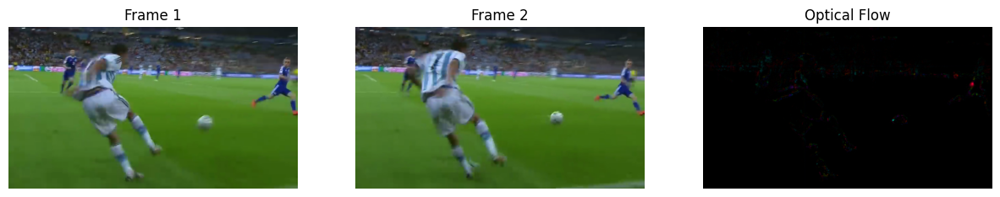

WinSize: 3


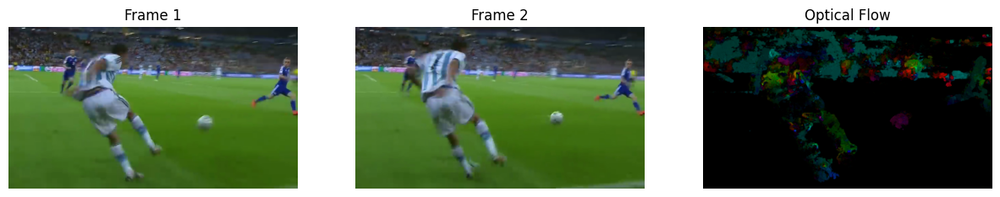

WinSize: 5


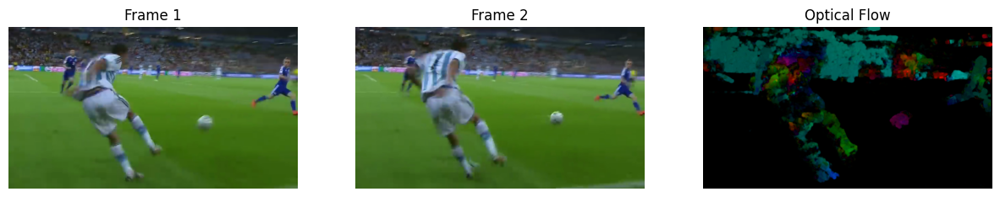

WinSize: 7


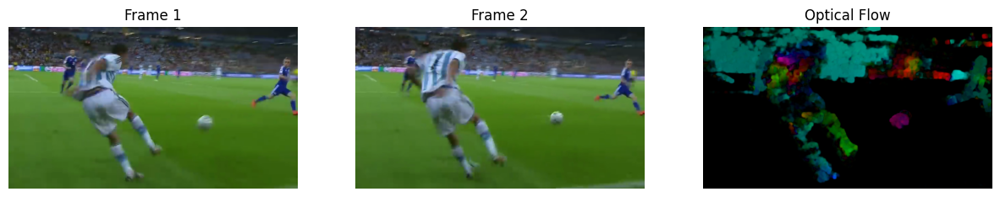

WinSize: 9


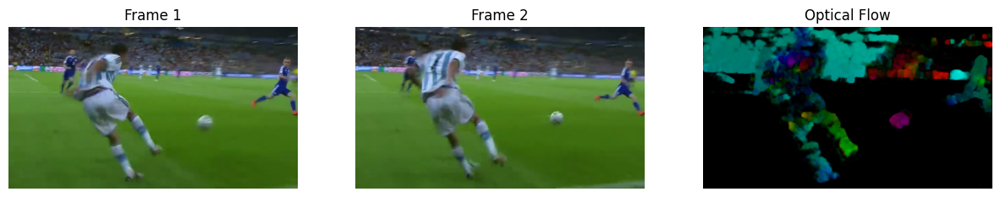

WinSize: 11


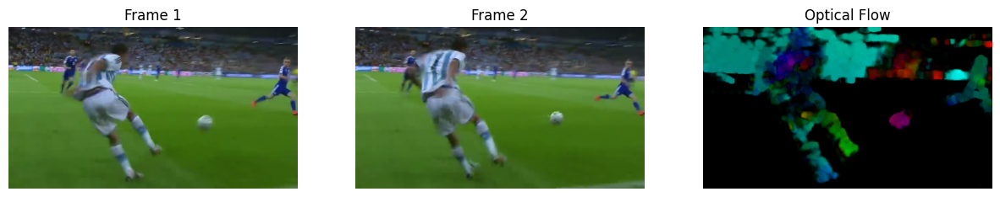

WinSize: 13


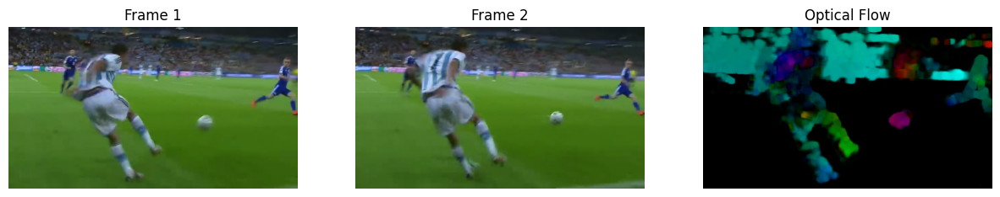

WinSize: 15


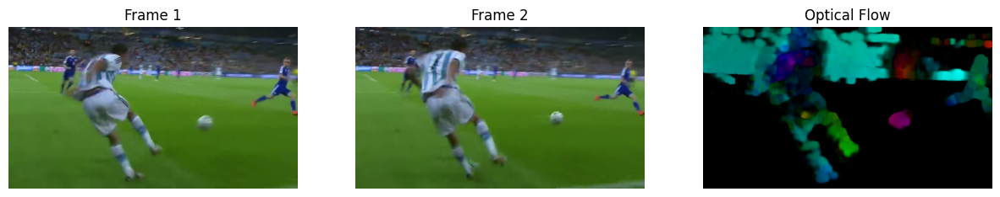

WinSize: 17


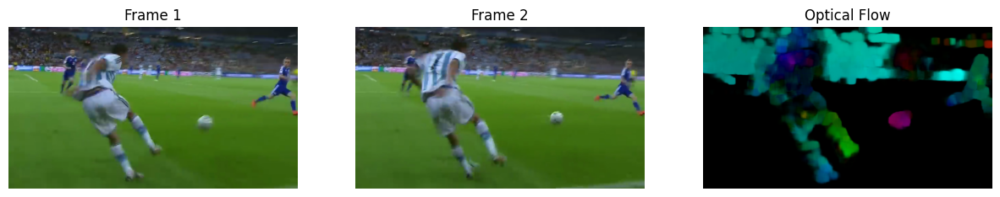

WinSize: 19


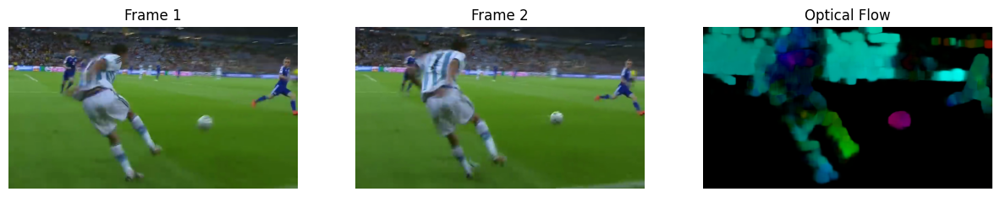

In [21]:
back_vid = cv2.VideoCapture(joined_back_path)
fps = back_vid.get(cv2.CAP_PROP_FPS)
seconds_to_skip = 1.3

back_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, back_frame_old = back_vid.read()

_, back_frame = back_vid.read()

for i in range(1, 21, 2):
    back_optical_flow = calc_and_display_optical_flow(
        back_frame_old, back_frame, 0.5, 3, i, 3, 5, 1.2, 0
    )
    print(f"WinSize: {i}")
    display_optical_flow_results(back_frame_old, back_frame, back_optical_flow)

---

### Zadanie 2

Powtórz powyższy eksperyment na materiale `shot.mp4` (przewiń materiał do momentu natychmiast po uderzeniu białej bili, ok. 20-25 klatek; framerate wynosi tu ok. 15fps).  
*Czy algorytm działa tak samo dobrze? Dlaczego? Co jest ograniczeniem metody?*

fps: 15.135135135135135
frame: 21
WinSize: 1


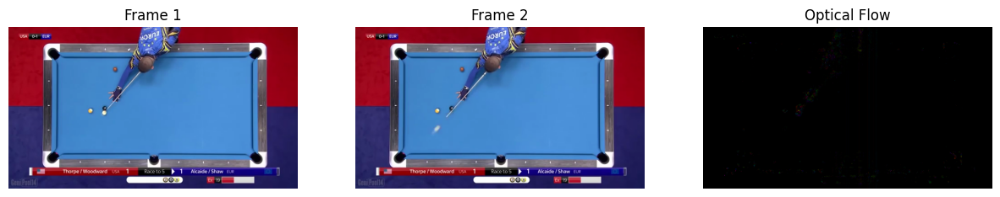

frame: 21
WinSize: 3


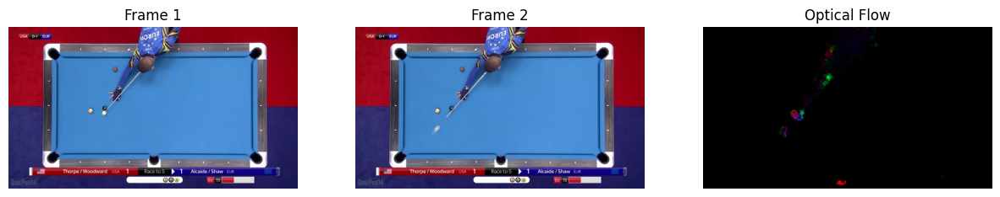

frame: 21
WinSize: 5


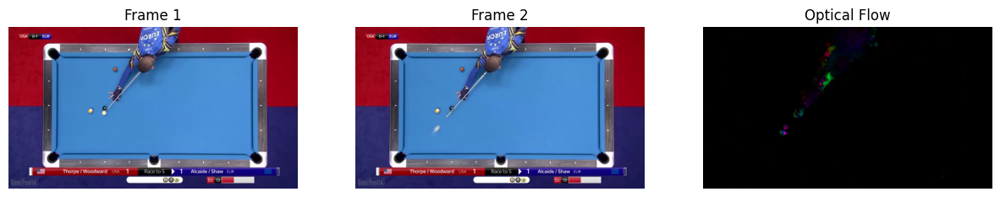

frame: 21
WinSize: 7


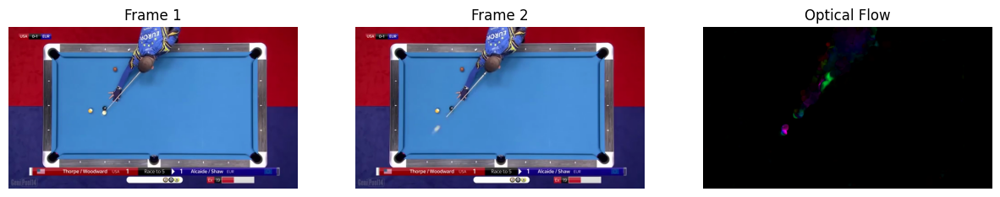

frame: 21
WinSize: 9


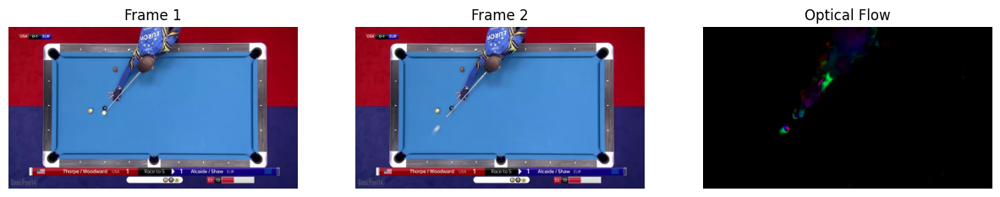

frame: 21
WinSize: 11


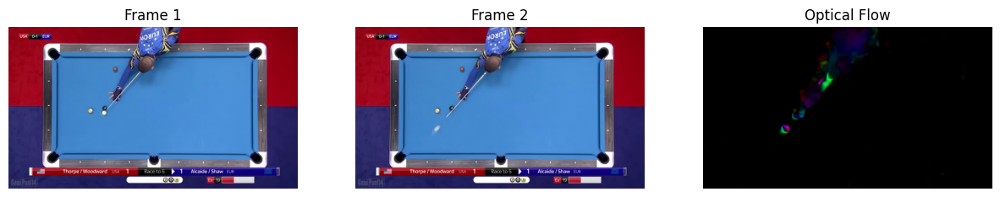

frame: 21
WinSize: 13


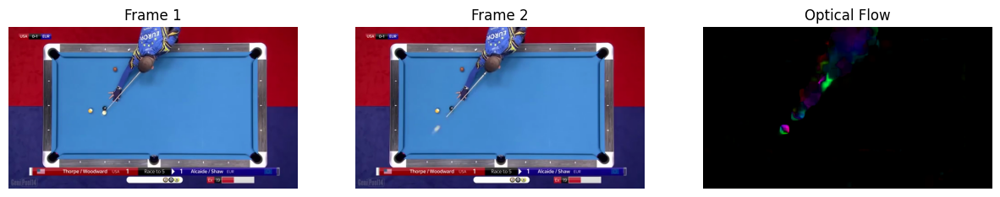

frame: 21
WinSize: 15


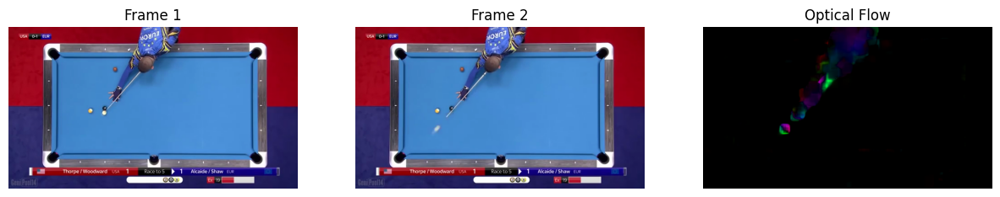

frame: 21
WinSize: 17


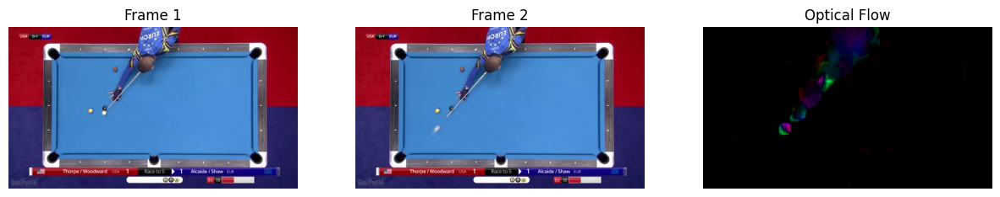

frame: 21
WinSize: 19


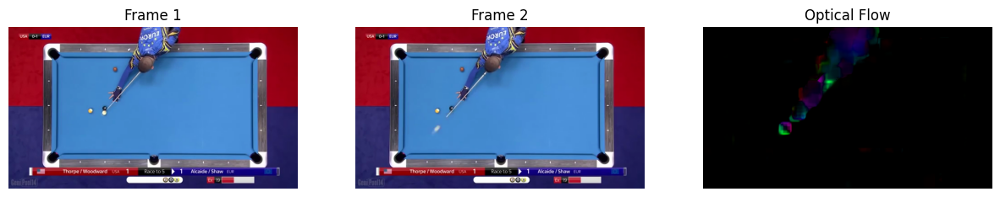

In [ ]:
# load shot.mp4 video skip 20,25 frames
shot_path = "shot.mp4"
joined_shot_path = os.path.join(data_dir_path, shot_path)

shot_vid = cv2.VideoCapture(joined_shot_path)
fps = shot_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frames_to_skip = 20
seconds_to_skip = frames_to_skip / fps

shot_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, shot_frame_old = shot_vid.read()

_, shot_frame = shot_vid.read()

for i in range(1, 21, 2):
    shot_optical_flow = calc_and_display_optical_flow(
        shot_frame_old, shot_frame, 0.5, 3, i, 3, 5, 1.2, 0
    )
    print(f"frame: {frames_to_skip + 1}")
    print(f"WinSize: {i}")
    display_optical_flow_results(shot_frame_old, shot_frame, shot_optical_flow)

fps: 15.135135135135135
frame: 23
WinSize: 1


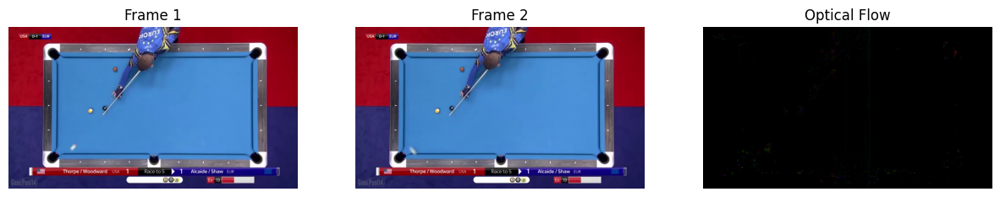

frame: 23
WinSize: 3


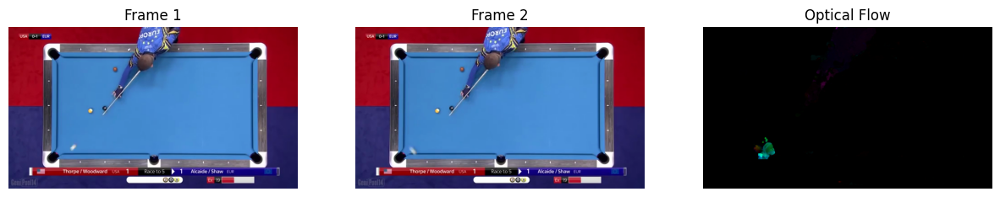

frame: 23
WinSize: 5


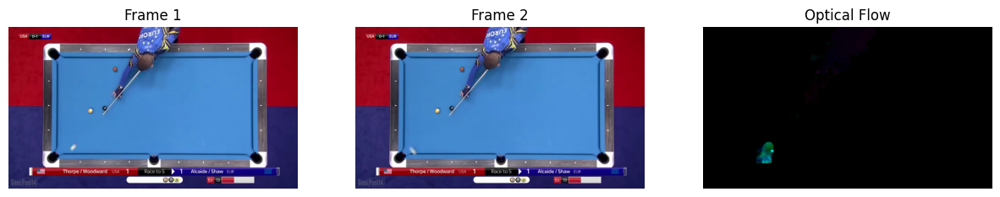

frame: 23
WinSize: 7


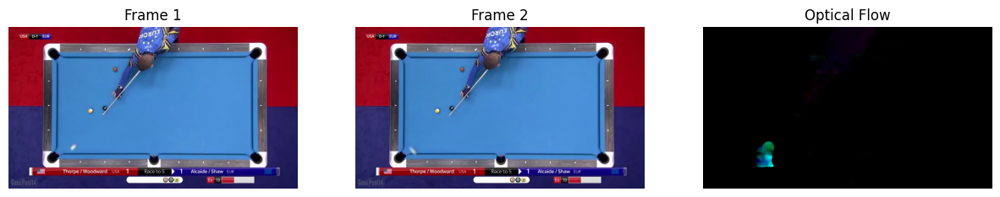

frame: 23
WinSize: 9


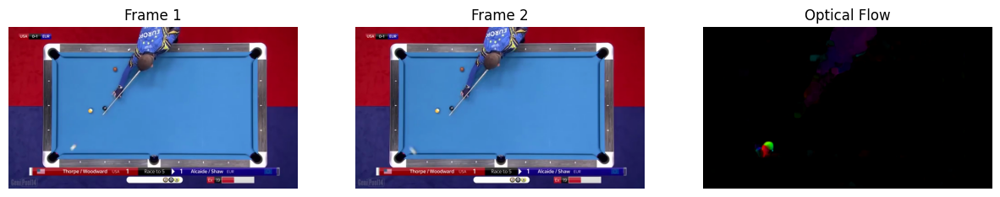

frame: 23
WinSize: 11


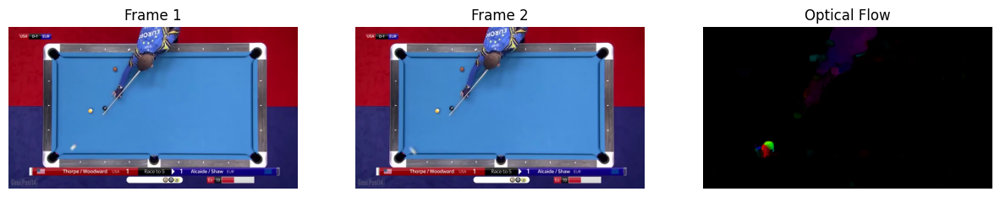

frame: 23
WinSize: 13


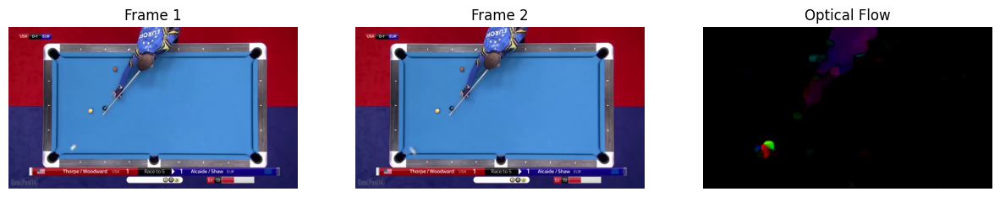

frame: 23
WinSize: 15


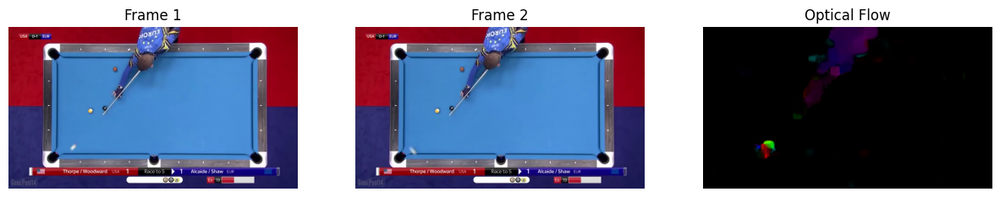

frame: 23
WinSize: 17


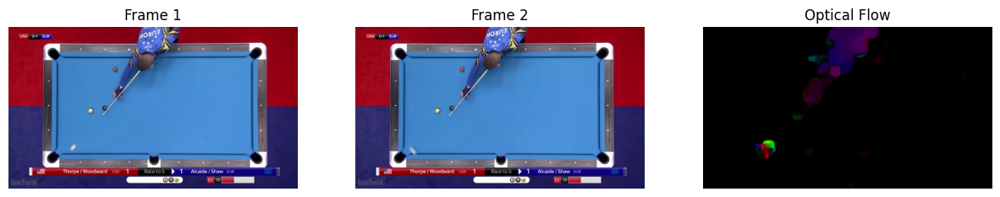

frame: 23
WinSize: 19


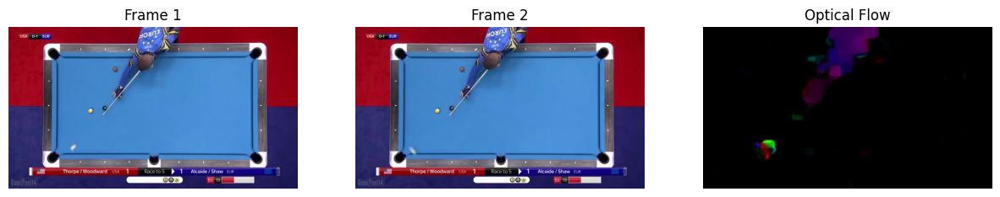

In [29]:
shot_path = "shot.mp4"
joined_shot_path = os.path.join(data_dir_path, shot_path)

shot_vid = cv2.VideoCapture(joined_shot_path)
fps = shot_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frames_to_skip = 22
seconds_to_skip = frames_to_skip / fps

shot_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, shot_frame_old = shot_vid.read()

_, shot_frame = shot_vid.read()

for i in range(1, 21, 2):
    shot_optical_flow = calc_and_display_optical_flow(
        shot_frame_old, shot_frame, 0.5, 3, i, 3, 5, 1.2, 0
    )
    print(f"frame: {frames_to_skip + 1}")
    print(f"WinSize: {i}")
    display_optical_flow_results(shot_frame_old, shot_frame, shot_optical_flow)

Komentarz 2:
1. No niekoniecznie :) - element zbyt szybko się porusza jest rozmazany. ciekawy efekt połowa bili się porusza w jednym kierunku, a druga w drugim. Widać, że algorytm nie radzi sobie z tak szybkim ruchem. Widać, że algorytm działa dobrze dla ruchu, który jest bardziej płynny, wolniejszy, co już pięknie widać w przykładzie wyżej. 25 skip

##### Playground

In [ ]:
shot_path = "shot.mp4"
joined_shot_path = os.path.join(data_dir_path, shot_path)

shot_vid = cv2.VideoCapture(joined_shot_path)
fps = shot_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frames_to_skip = 20
seconds_to_skip = frames_to_skip / fps

shot_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, shot_frame_old = shot_vid.read()

_, shot_frame = shot_vid.read()

for i in range(1, 21, 2):
    shot_optical_flow = calc_and_display_optical_flow(
        shot_frame_old, shot_frame, 0.5, i, 8, 3, 5, 1.2, 0
    )
    print(f"frame: {frames_to_skip + 1}")
    print(f"param value: {i}")
    display_optical_flow_results(shot_frame_old, shot_frame, shot_optical_flow)

fps: 15.135135135135135
frame: 22
param value: 9


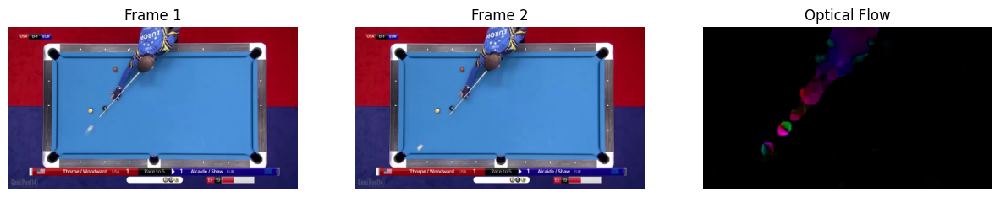

In [42]:
shot_path = "shot.mp4"
joined_shot_path = os.path.join(data_dir_path, shot_path)

shot_vid = cv2.VideoCapture(joined_shot_path)
fps = shot_vid.get(cv2.CAP_PROP_FPS)
print(f"fps: {fps}")
frames_to_skip = 21
seconds_to_skip = frames_to_skip / fps

shot_vid.set(cv2.CAP_PROP_POS_MSEC, seconds_to_skip * 1000)
_, shot_frame_old = shot_vid.read()

_, shot_frame = shot_vid.read()

shot_optical_flow = calc_and_display_optical_flow(
    shot_frame_old, shot_frame, 0.3, 3, 15, 3, 3, 1.2, 0
)
print(f"frame: {frames_to_skip + 1}")
print(f"param value: {i}")
display_optical_flow_results(shot_frame_old, shot_frame, shot_optical_flow)

### Zadanie dla chętnych

Powróć do takiego przypadku i konfiguracji algorytmu, dla którego uzyskane przez Ciebie wyniki były satysfakcjonujące. Przypomnij sobie zajęcia dotyczące np. segmentacji i wykorzystaj informację o przepływie optycznym do oddzielenia na obrazie obiektów od tła (metoda zupełnie dowolna).